In [1]:
import pandas as pd

# Load the dataset
file_path = '/content/NYPD_Shooting_Incident_Data__Historic__20241024.csv'
nypd_data = pd.read_csv(file_path)

# Display the first few rows of the dataset to understand its structure
nypd_data.head()

,INCIDENT_KEY,OCCUR_DATE,OCCUR_TIME,BORO,LOC_OF_OCCUR_DESC,PRECINCT,JURISDICTION_CODE,LOC_CLASSFCTN_DESC,LOCATION_DESC,STATISTICAL_MURDER_FLAG,...,PERP_SEX,PERP_RACE,VIC_AGE_GROUP,VIC_SEX,VIC_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat
0,244608249,05/05/2022,00:10:00,MANHATTAN,INSIDE,14,0.0,COMMERCIAL,VIDEO STORE,True,...,M,BLACK,25-44,M,BLACK,986050.000,214231.000000,40.754692,-73.993500,POINT (-73.9935 40.754692)
1,247542571,07/04/2022,22:20:00,BRONX,OUTSIDE,48,0.0,STREET,(null),True,...,(null),(null),18-24,M,BLACK,1016802.000,250581.000000,40.854402,-73.882330,POINT (-73.88233 40.854402)
2,84967535,05/27/2012,19:35:00,QUEENS,NaN,103,0.0,NaN,NaN,False,...,NaN,NaN,18-24,M,BLACK,1048632.000,198262.000000,40.710634,-73.767773,POINT (-73.76777349199995 40.71063412500007)
3,202853370,09/24/2019,21:00:00,BRONX,NaN,42,0.0,NaN,NaN,False,...,M,UNKNOWN,25-44,M,BLACK,1014493.000,242565.000000,40.832417,-73.890714,POINT (-73.89071440599997 40.832416753000075)
4,27078636,02/25/2007,21:00:00,BROOKLYN,NaN,83,0.0,NaN,NaN,False,...,M,BLACK,25-44,M,BLACK,1009149.375,190104.703125,40.688443,-73.910219,POINT (-73.91021857399994 40.68844345900004)


In [2]:
# Check for missing values and data types in the dataset
missing_values = nypd_data.isnull().sum()
data_types = nypd_data.dtypes

# Display the results
print("Missing Values:\n", missing_values)
print("\nData Types:\n", data_types)

Missing Values:
 INCIDENT_KEY                   0
OCCUR_DATE                     0
OCCUR_TIME                     0
BORO                           0
LOC_OF_OCCUR_DESC          25596
PRECINCT                       0
JURISDICTION_CODE              2
LOC_CLASSFCTN_DESC         25596
LOCATION_DESC              14977
STATISTICAL_MURDER_FLAG        0
PERP_AGE_GROUP              9344
PERP_SEX                    9310
PERP_RACE                   9310
VIC_AGE_GROUP                  0
VIC_SEX                        0
VIC_RACE                       0
X_COORD_CD                     0
Y_COORD_CD                     0
Latitude                      59
Longitude                     59
Lon_Lat                       59
dtype: int64

Data Types:
 INCIDENT_KEY                 int64
OCCUR_DATE                  object
OCCUR_TIME                  object
BORO                        object
LOC_OF_OCCUR_DESC           object
PRECINCT                     int64
JURISDICTION_CODE          float64
LOC_CLASSFCTN_DESC

In [3]:
# Summarize dataset basic stats
summary_stats = nypd_data.describe(include='all')

# Display missing values and data types, and summary stats
missing_values, data_types, summary_stats

(INCIDENT_KEY                   0
 OCCUR_DATE                     0
 OCCUR_TIME                     0
 BORO                           0
 LOC_OF_OCCUR_DESC          25596
 PRECINCT                       0
 JURISDICTION_CODE              2
 LOC_CLASSFCTN_DESC         25596
 LOCATION_DESC              14977
 STATISTICAL_MURDER_FLAG        0
 PERP_AGE_GROUP              9344
 PERP_SEX                    9310
 PERP_RACE                   9310
 VIC_AGE_GROUP                  0
 VIC_SEX                        0
 VIC_RACE                       0
 X_COORD_CD                     0
 Y_COORD_CD                     0
 Latitude                      59
 Longitude                     59
 Lon_Lat                       59
 dtype: int64,
 INCIDENT_KEY                 int64
 OCCUR_DATE                  object
 OCCUR_TIME                  object
 BORO                        object
 LOC_OF_OCCUR_DESC           object
 PRECINCT                     int64
 JURISDICTION_CODE          float64
 LOC_CLASSFCTN_DESC

In [4]:
# Convert `OCCUR_DATE` and `OCCUR_TIME` columns to datetime types for temporal analysis
nypd_data['OCCUR_DATE'] = pd.to_datetime(nypd_data['OCCUR_DATE'], errors='coerce')
nypd_data['OCCUR_TIME'] = pd.to_datetime(nypd_data['OCCUR_TIME'], format='%H:%M:%S', errors='coerce').dt.time

# Create additional temporal features for analysis
nypd_data['Year'] = nypd_data['OCCUR_DATE'].dt.year
nypd_data['Month'] = nypd_data['OCCUR_DATE'].dt.month
nypd_data['DayOfWeek'] = nypd_data['OCCUR_DATE'].dt.day_name()

In [5]:
# Analyze temporal trends, location distribution, and demographic breakdowns for the dataset
# 1. Yearly and monthly shooting incident trends
yearly_trends = nypd_data['Year'].value_counts().sort_index()
monthly_trends = nypd_data.groupby(['Year', 'Month']).size().unstack(fill_value=0)

In [6]:
# 2. Distribution of incidents by borough
borough_distribution = nypd_data['BORO'].value_counts()

In [7]:

# 3. Demographic breakdown: Victim age group and gender
victim_age_group = nypd_data['VIC_AGE_GROUP'].value_counts()
victim_gender = nypd_data['VIC_SEX'].value_counts()

In [8]:
import pandas as pd
yearly_trends = nypd_data['Year'].value_counts().sort_index()
print(yearly_trends.to_frame("Incidents"))

      Incidents
Year           
2006       2055
2007       1887
2008       1959
2009       1828
2010       1912
2011       1939
2012       1717
2013       1339
2014       1464
2015       1434
2016       1208
2017        970
2018        958
2019        967
2020       1948
2021       2011
2022       1716
2023       1250


In [9]:
monthly_trends = nypd_data.groupby(['Year', 'Month']).size().unstack(fill_value=0)
print(monthly_trends)


Month   1    2    3    4    5    6    7    8    9    10   11   12
Year                                                             
2006   129   97  102  156  173  180  233  245  196  199  167  178
2007   109   78  103  117  199  201  239  212  173  197  135  124
2008   114   80  128  153  194  197  234  215  197  153  130  164
2009   105  113  104  136  172  182  211  210  167  143  161  124
2010    97  123  132  167  166  219  211  203  182  144  140  128
2011   102   98   89  136  176  178  221  217  250  188  133  151
2012   114  101  130  127  173  183  247  191  140  113   98  100
2013   119   66   85   94   99  139  141  162  120  125   98   91
2014   107   52  109   98  129  153  161  169  109  130  107  140
2015   117   68   93  106  181  135  132  162  115  103  104  118
2016    79   74   79   72  108  116  112  184  128  105   77   74
2017    68   48   56   81   88  113  104   96   90   89   61   76
2018    88   41   56   68   98   90  114   92   82   83   71   75
2019    63

In [10]:
borough_distribution = nypd_data['BORO'].value_counts()
print(borough_distribution.to_frame("Incidents"))


               Incidents
BORO                    
BROOKLYN           11346
BRONX               8376
QUEENS              4271
MANHATTAN           3762
STATEN ISLAND        807


In [11]:
victim_age_group = nypd_data['VIC_AGE_GROUP'].value_counts()
print(victim_age_group.to_frame("Count"))

               Count
VIC_AGE_GROUP       
25-44          12973
18-24          10384
<18             2954
45-64           1981
65+              205
UNKNOWN           64
1022               1


In [12]:
victim_gender = nypd_data['VIC_SEX'].value_counts()
print(victim_gender.to_frame("Count"))


         Count
VIC_SEX       
M        25790
F         2760
U           12


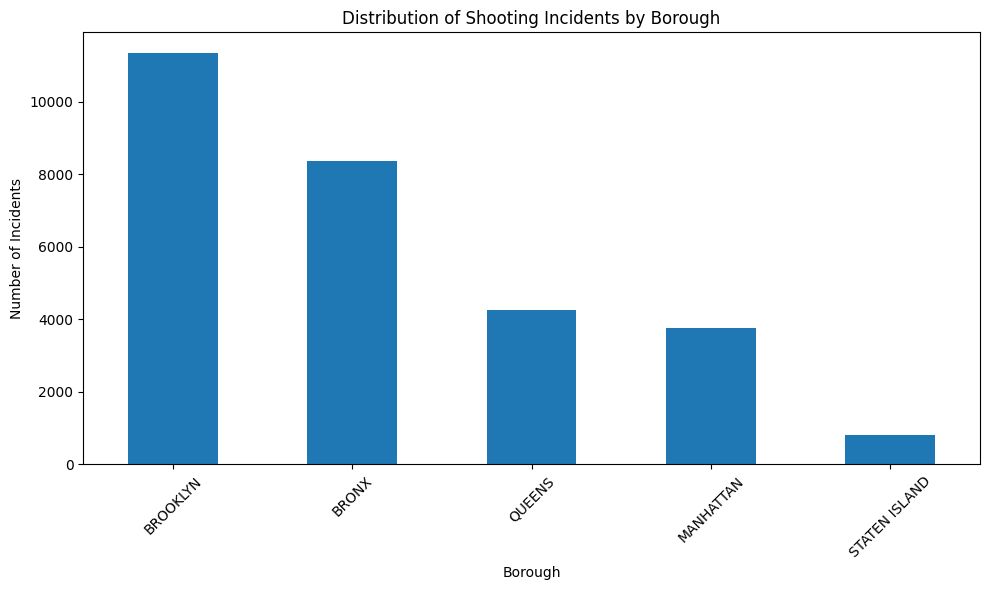

In [13]:
import matplotlib.pyplot as plt

# Visualize the borough distribution of shooting incidents
plt.figure(figsize=(10, 6))
borough_distribution.plot(kind='bar')
plt.title('Distribution of Shooting Incidents by Borough')
plt.xlabel('Borough')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

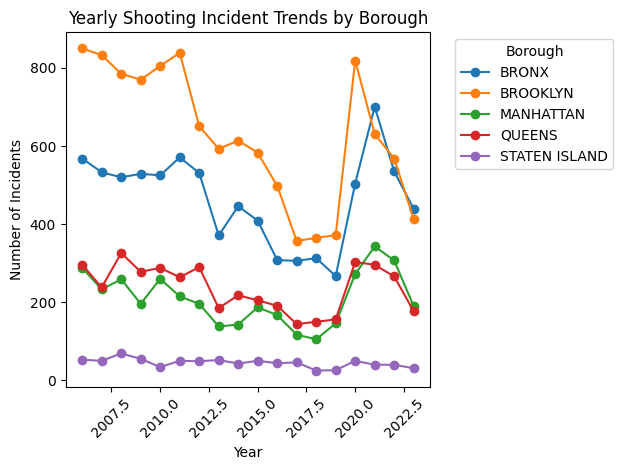

In [14]:
# Aggregate the data by year and borough to show trends over time
borough_yearly_trends = nypd_data.groupby(['Year', 'BORO']).size().unstack(fill_value=0)

# Plotting the trends over time by borough
plt.figure(figsize=(12, 8))
borough_yearly_trends.plot(marker='o')
plt.title('Yearly Shooting Incident Trends by Borough')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

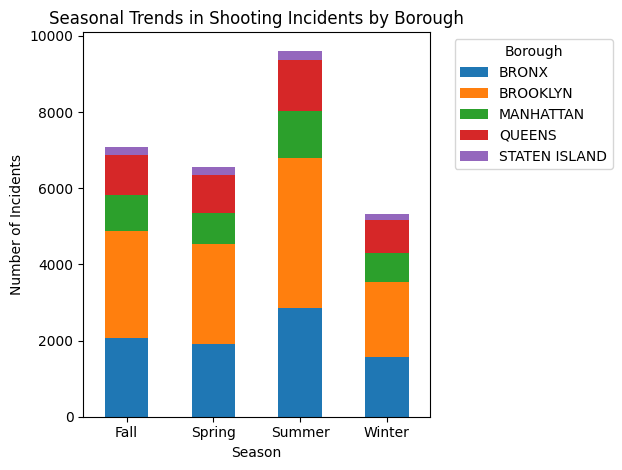

In [15]:
# Create a 'Season' column based on the month for seasonal analysis
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

nypd_data['Season'] = nypd_data['Month'].apply(get_season)

# Aggregate by season and borough
seasonal_trends = nypd_data.groupby(['Season', 'BORO']).size().unstack(fill_value=0)

# Plot seasonal trends by borough
plt.figure(figsize=(10, 6))
seasonal_trends.plot(kind='bar', stacked=True)
plt.title('Seasonal Trends in Shooting Incidents by Borough')
plt.xlabel('Season')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=0)
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

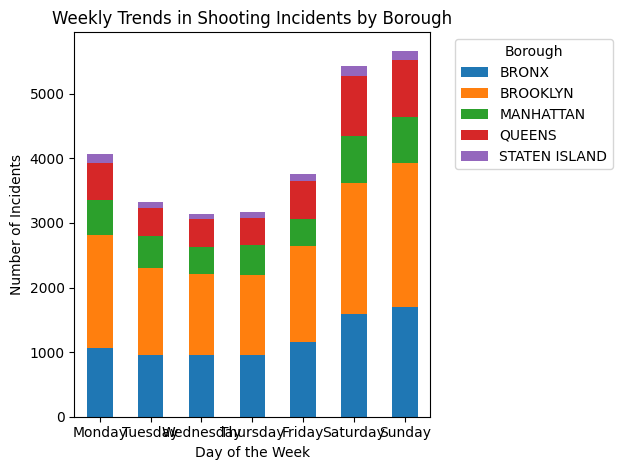

In [16]:
# Aggregate by day of the week and borough
weekday_trends = nypd_data.groupby(['DayOfWeek', 'BORO']).size().unstack(fill_value=0)

# Reorder days of the week for accurate representation
ordered_days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
weekday_trends = weekday_trends.reindex(ordered_days)

# Plot trends by weekday for each borough
plt.figure(figsize=(10, 6))
weekday_trends.plot(kind='bar', stacked=True)
plt.title('Weekly Trends in Shooting Incidents by Borough')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=0)
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


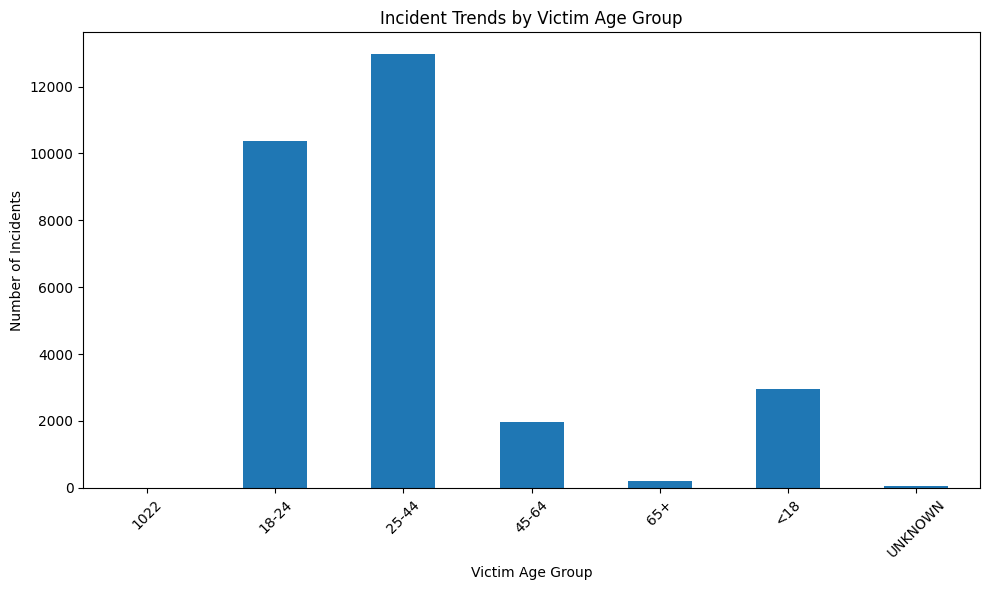

In [17]:
# Aggregate incidents by victim age group
age_trends = nypd_data['VIC_AGE_GROUP'].value_counts().sort_index()

# Plot incident trends by victim age group
plt.figure(figsize=(10, 6))
age_trends.plot(kind='bar')
plt.title('Incident Trends by Victim Age Group')
plt.xlabel('Victim Age Group')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


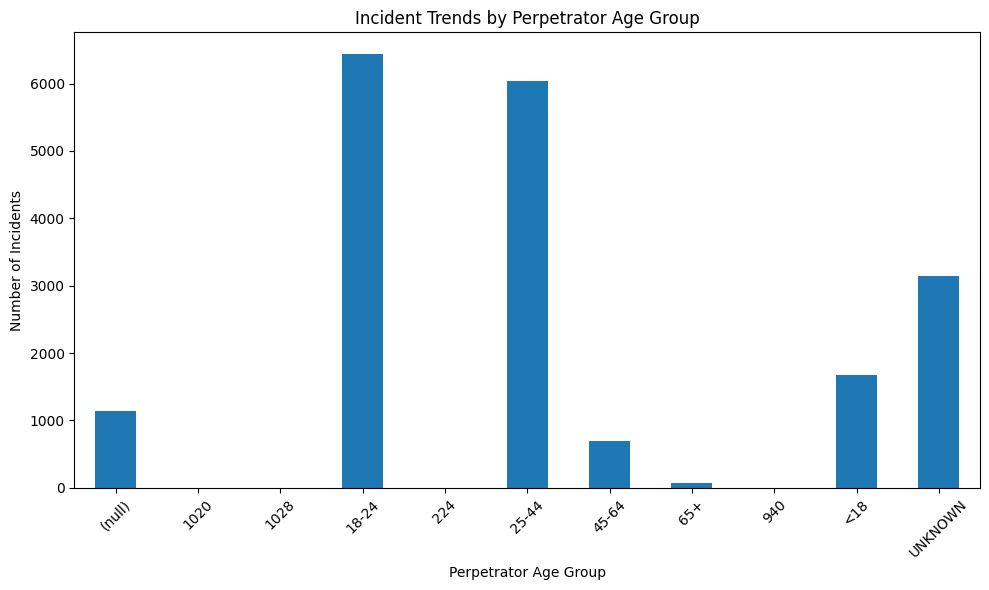

In [18]:
# Aggregate incidents by perpetrator age group
perp_age_trends = nypd_data['PERP_AGE_GROUP'].value_counts().sort_index()

# Plot incident trends by perpetrator age group
plt.figure(figsize=(10, 6))
perp_age_trends.plot(kind='bar')
plt.title('Incident Trends by Perpetrator Age Group')
plt.xlabel('Perpetrator Age Group')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


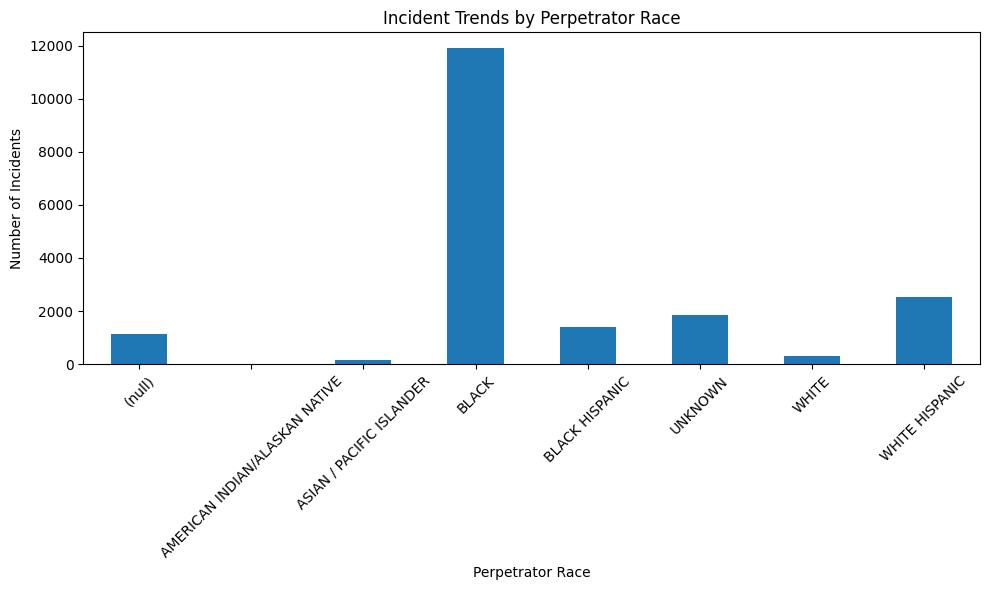

In [19]:
# Aggregate incidents by perpetrator race
perp_race_trends = nypd_data['PERP_RACE'].value_counts().sort_index()

# Plot incident trends by perpetrator race
plt.figure(figsize=(10, 6))
perp_race_trends.plot(kind='bar')
plt.title('Incident Trends by Perpetrator Race')
plt.xlabel('Perpetrator Race')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

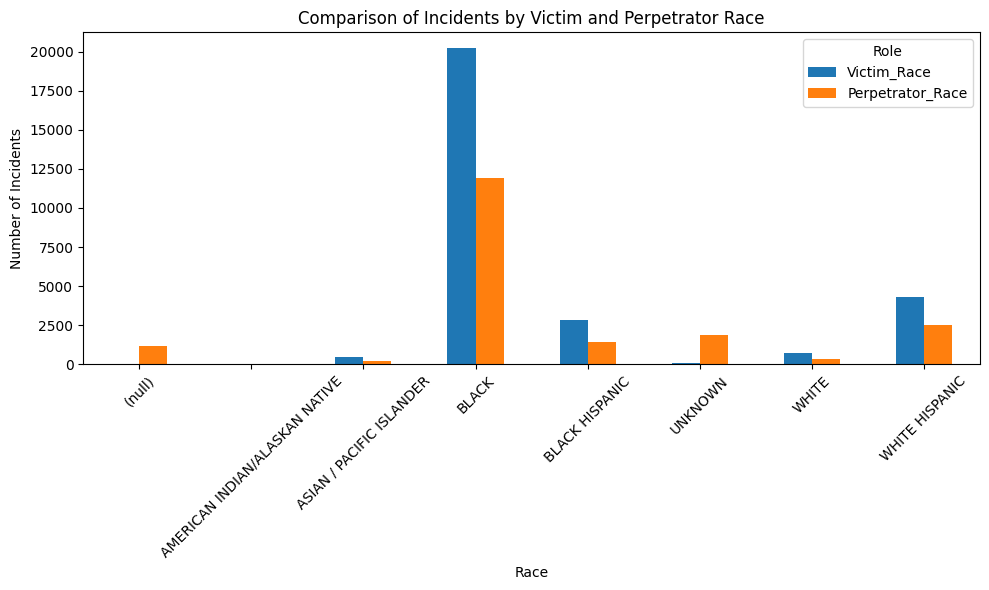

In [20]:
# Aggregate incidents by both victim and perpetrator race
victim_race_trends = nypd_data['VIC_RACE'].value_counts().sort_index()
perp_race_trends = nypd_data['PERP_RACE'].value_counts().sort_index()

# Combine victim and perpetrator race trends into one DataFrame for comparison
race_comparison = pd.DataFrame({'Victim_Race': victim_race_trends, 'Perpetrator_Race': perp_race_trends}).fillna(0)

# Plot comparison of incidents by victim and perpetrator race
race_comparison.plot(kind='bar', figsize=(10, 6))
plt.title('Comparison of Incidents by Victim and Perpetrator Race')
plt.xlabel('Race')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.legend(title='Role')
plt.tight_layout()
plt.show()


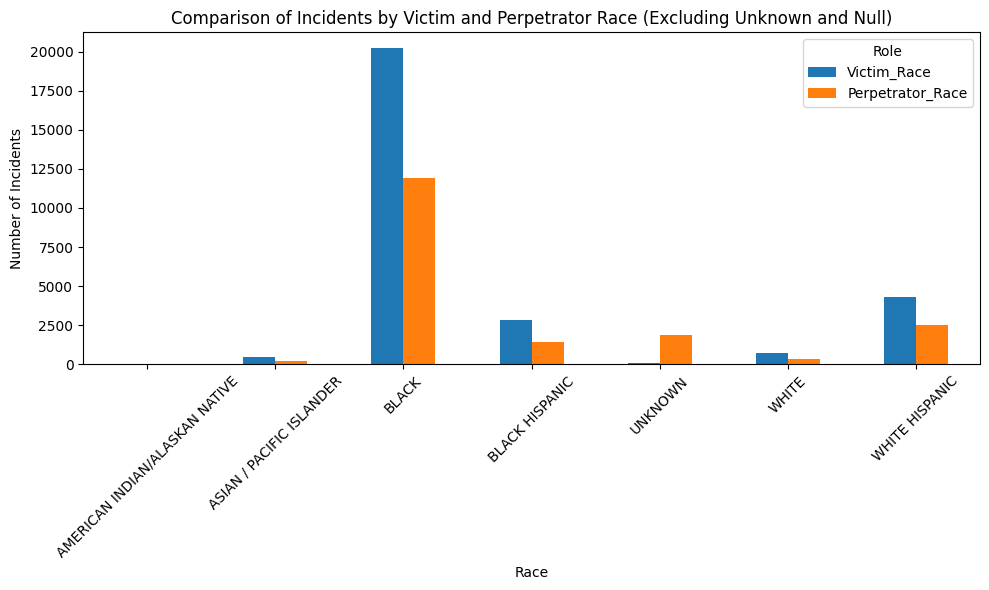

In [21]:
# prompt: how can i create a new bar graph Comparison of Incidents by Victim and Perpetrator Race' excluding unkown and (null) columns

# Aggregate incidents by both victim and perpetrator race, excluding 'Unknown' and '(null)'
victim_race_trends = nypd_data[~nypd_data['VIC_RACE'].isin(['Unknown', '(null)'])]['VIC_RACE'].value_counts().sort_index()
perp_race_trends = nypd_data[~nypd_data['PERP_RACE'].isin(['Unknown', '(null)'])]['PERP_RACE'].value_counts().sort_index()

# Combine victim and perpetrator race trends into one DataFrame for comparison
race_comparison = pd.DataFrame({'Victim_Race': victim_race_trends, 'Perpetrator_Race': perp_race_trends}).fillna(0)

# Plot comparison of incidents by victim and perpetrator race, excluding 'Unknown' and '(null)'
race_comparison.plot(kind='bar', figsize=(10, 6))
plt.title('Comparison of Incidents by Victim and Perpetrator Race (Excluding Unknown and Null)')
plt.xlabel('Race')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.legend(title='Role')
plt.tight_layout()
plt.show()

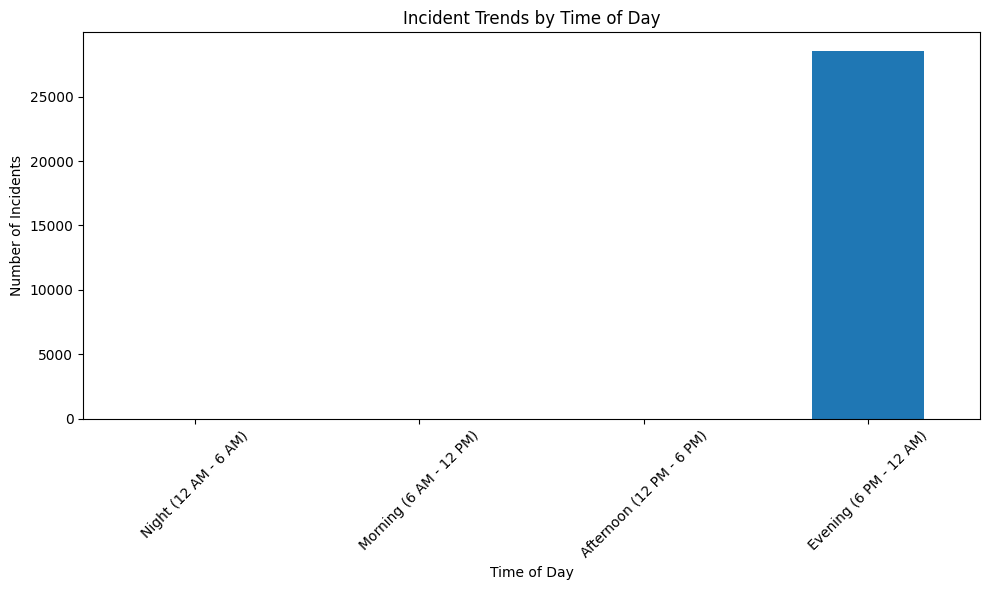

In [22]:
# Create time-of-day categories based on occur time
def time_of_day(hour):
    if 0 <= hour < 6:
        return 'Night (12 AM - 6 AM)'
    elif 6 <= hour < 12:
        return 'Morning (6 AM - 12 PM)'
    elif 12 <= hour < 18:
        return 'Afternoon (12 PM - 6 PM)'
    else:
        return 'Evening (6 PM - 12 AM)'

# Extract hour from OCCUR_TIME and apply the function
nypd_data['Hour'] = pd.to_datetime(nypd_data['OCCUR_TIME'], errors='coerce').dt.hour
nypd_data['TimeOfDay'] = nypd_data['Hour'].apply(time_of_day)

# Aggregate by time of day
time_of_day_trends = nypd_data['TimeOfDay'].value_counts().reindex(
    ['Night (12 AM - 6 AM)', 'Morning (6 AM - 12 PM)', 'Afternoon (12 PM - 6 PM)', 'Evening (6 PM - 12 AM)']
)

# Plot incident trends by time of day
plt.figure(figsize=(10, 6))
time_of_day_trends.plot(kind='bar')
plt.title('Incident Trends by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<Figure size 1000x1000 with 0 Axes>

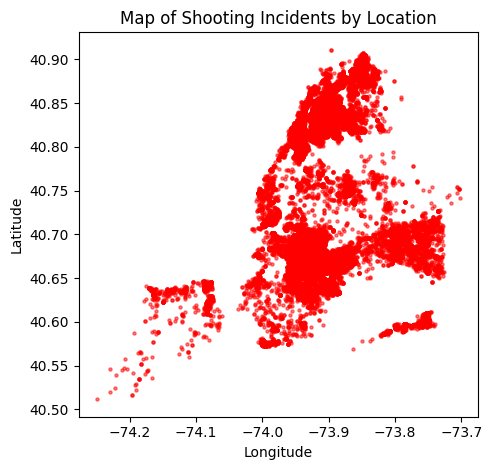

True

In [23]:
import geopandas as gpd
from matplotlib import pyplot as plt

# Check if coordinate columns are present and drop missing values for mapping
if 'Latitude' in nypd_data.columns and 'Longitude' in nypd_data.columns:
    # Drop rows with missing coordinates
    mapped_data = nypd_data.dropna(subset=['Latitude', 'Longitude'])

    # Create a GeoDataFrame for mapping
    gdf = gpd.GeoDataFrame(mapped_data,
                           geometry=gpd.points_from_xy(mapped_data.Longitude, mapped_data.Latitude),
                           crs="EPSG:4326")

    # Plot the incidents mapped by precinct (note: without shapefile for precincts)
    plt.figure(figsize=(10, 10))
    gdf.plot(marker='o', color='red', markersize=5, alpha=0.5, legend=True)
    plt.title('Map of Shooting Incidents by Location')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.tight_layout()
    plt.show()
else:
    mapped_data = None

mapped_data is not None


<Figure size 1000x1000 with 0 Axes>

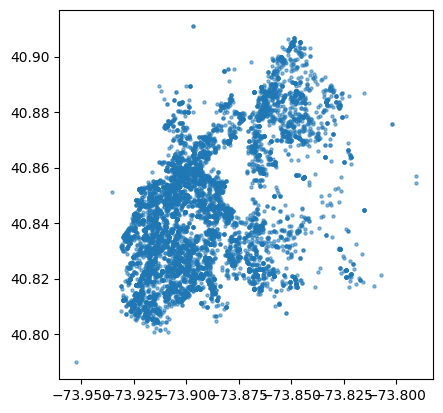

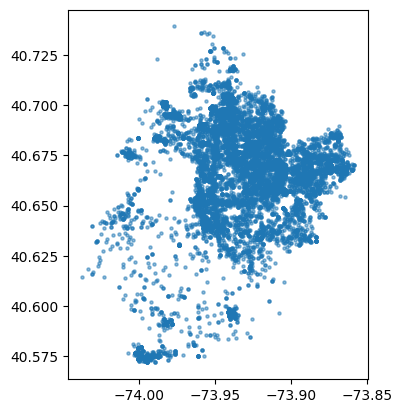

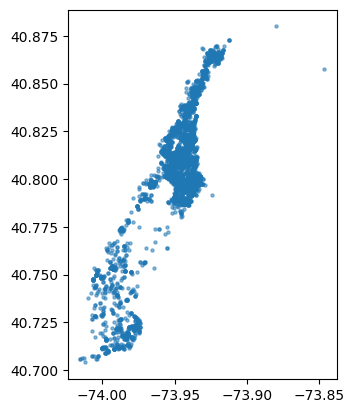

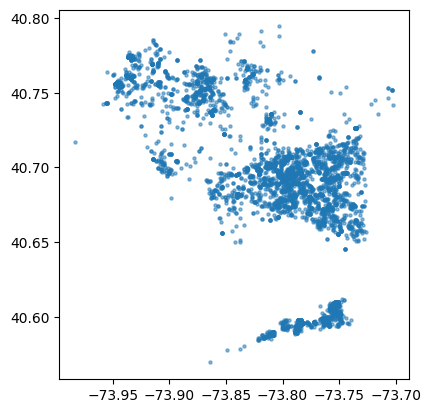

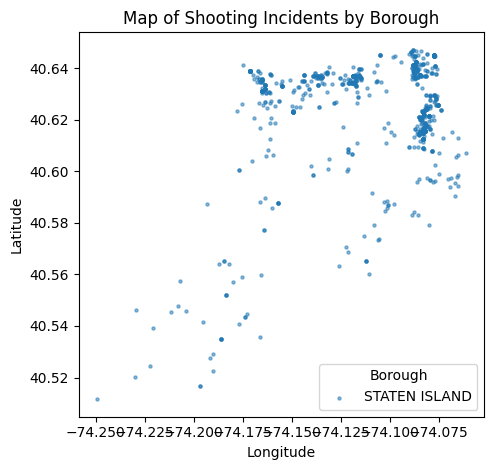

In [24]:
# Plot the incidents by borough on a map
plt.figure(figsize=(10, 10))
for borough, data in gdf.groupby('BORO'):
    data.plot(marker='o', label=borough, markersize=5, alpha=0.5)

plt.title('Map of Shooting Incidents by Borough')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title="Borough")
plt.tight_layout()
plt.show()


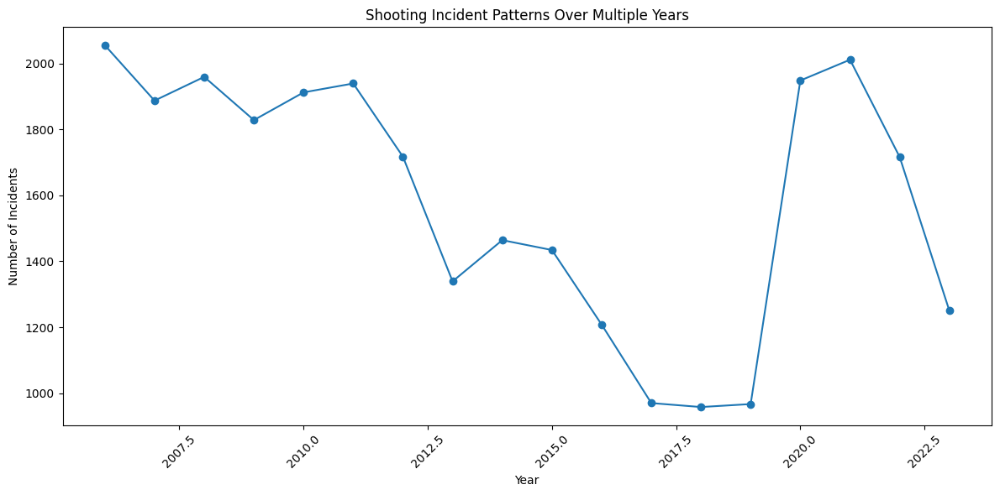

In [25]:
# Aggregate incidents by year and visualize to observe multi-year patterns
multi_year_trends = nypd_data['Year'].value_counts().sort_index()

# Plot the multi-year incident trends
plt.figure(figsize=(12, 6))
multi_year_trends.plot(marker='o')
plt.title('Shooting Incident Patterns Over Multiple Years')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


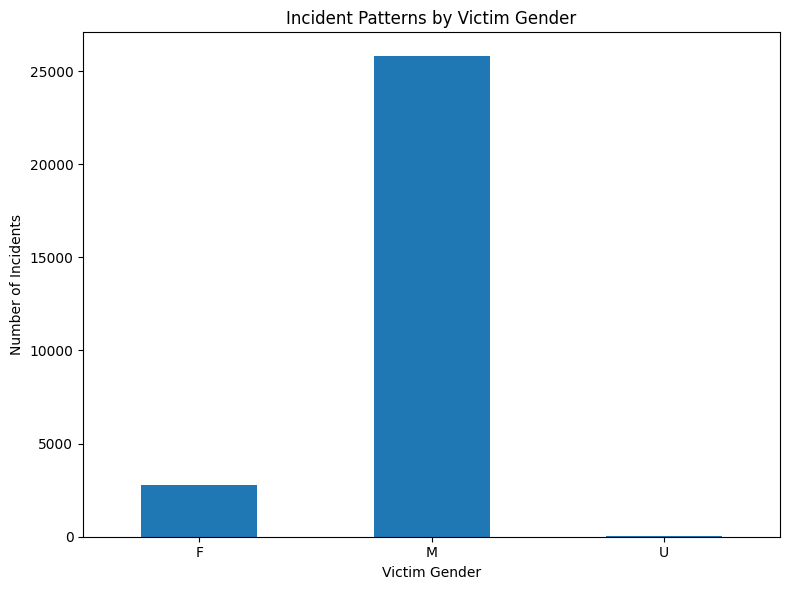

In [26]:
# Aggregate incidents by victim gender
victim_gender_trends = nypd_data['VIC_SEX'].value_counts().sort_index()

# Plot incident patterns by victim gender
plt.figure(figsize=(8, 6))
victim_gender_trends.plot(kind='bar')
plt.title('Incident Patterns by Victim Gender')
plt.xlabel('Victim Gender')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


<Figure size 1000x1000 with 0 Axes>

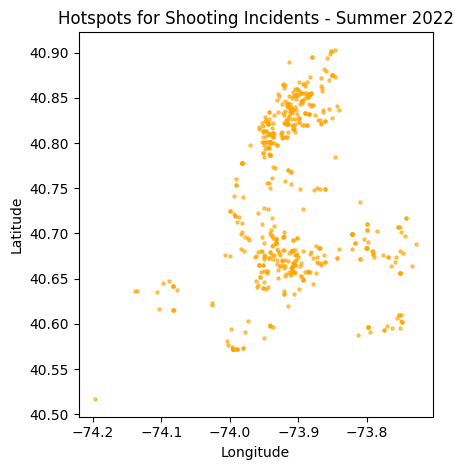

True

In [27]:
# To map hotspots by season and year, we'll create seasonal subsets for each year, if data allows.
# For simplicity, I'll generate a map for one example season and one year. This approach can be extended as needed.

import matplotlib.pyplot as plt
import geopandas as gpd

# Select example year and season for the hotspot map
example_year = 2022
example_season = 'Summer'

# Filter data for the chosen year and season
filtered_data = gdf[(gdf['Year'] == example_year) & (gdf['Season'] == example_season)]

# Check if there's data for this specific subset
if not filtered_data.empty:
    # Plot incidents for the chosen year and season
    plt.figure(figsize=(10, 10))
    filtered_data.plot(marker='o', color='orange', markersize=5, alpha=0.6, legend=True)
    plt.title(f'Hotspots for Shooting Incidents - {example_season} {example_year}')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.tight_layout()
    plt.show()
else:
    filtered_data = None

filtered_data is not None


<Figure size 1000x1000 with 0 Axes>

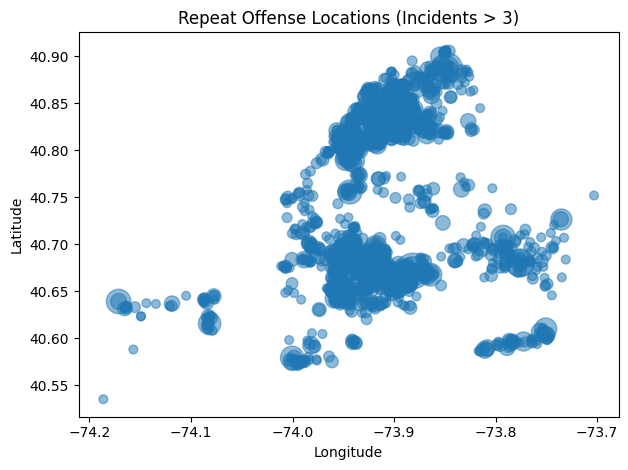

,Latitude,Longitude,PRECINCT,Incident_Count
3812,40.671413,-73.881510,75,66
3723,40.670655,-73.913391,73,47
13308,40.887451,-73.847608,47,47
3779,40.671107,-73.881433,75,44
11032,40.837324,-73.919831,44,42
...,...,...,...,...
13297,40.887106,-73.860863,47,4
13087,40.880037,-73.899353,50,4
2355,40.655726,-73.751294,105,4
2357,40.655756,-73.960805,71,4


In [28]:
# Identify repeat offense locations based on coordinates and precincts
# Group by Latitude, Longitude, and Precinct to count the occurrences of incidents at each location
repeat_locations = nypd_data.groupby(['Latitude', 'Longitude', 'PRECINCT']).size().reset_index(name='Incident_Count')

# Filter for locations with high recurrence (e.g., more than 3 incidents)
high_recurrence_locations = repeat_locations[repeat_locations['Incident_Count'] > 3].sort_values(by='Incident_Count', ascending=False)

# Display high recurrence locations and plot for visualization
plt.figure(figsize=(10, 10))
high_recurrence_locations.plot(kind='scatter', x='Longitude', y='Latitude', s=high_recurrence_locations['Incident_Count']*10, alpha=0.5)
plt.title('Repeat Offense Locations (Incidents > 3)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()


high_recurrence_locations


In [29]:
!pip install sweetviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 92.2 MB/s eta 0:00:00


In [30]:
!pip install ydata-profiling
!pip install pandas-profiling
!pip install pydantic-settings


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 29.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 55.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=b5668e3e6d8d2cfa0f635f8a3bf6db4f5107e890d222f8e3d21bbab989981f1f
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 9.4 MB/s eta 0:00:00


In [31]:
from ydata_profiling import ProfileReport
from IPython.display import display, HTML

In [32]:
import sweetviz as sv
report = sv.analyze(nypd_data)

from IPython.display import IFrame

report.show_html('report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



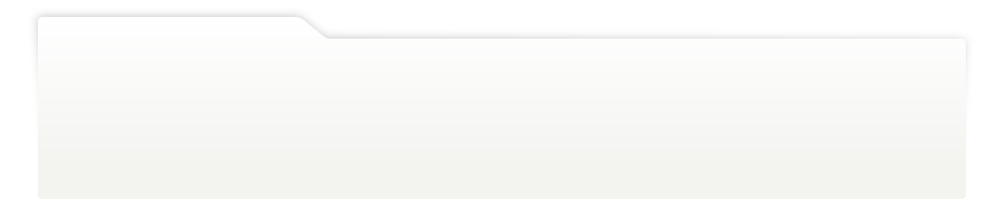
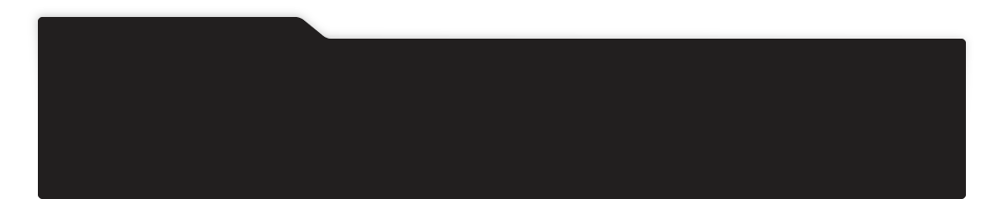
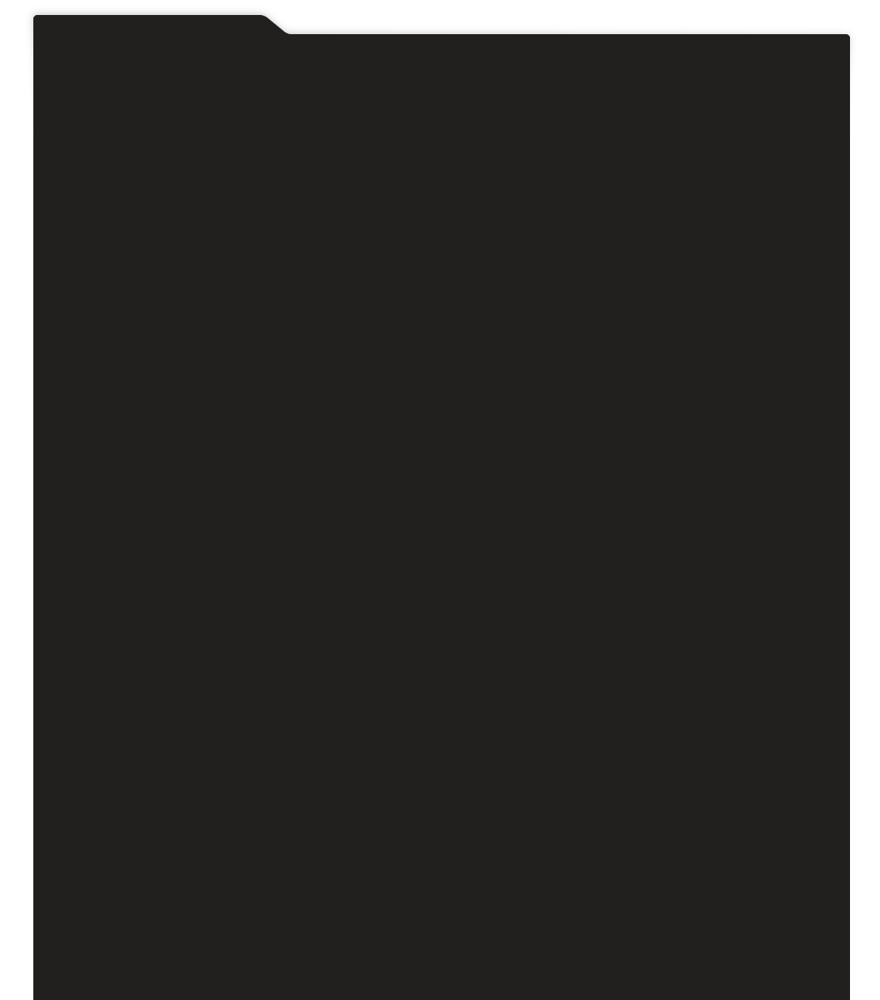
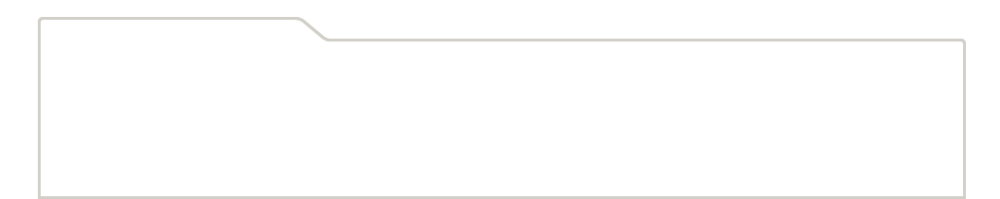
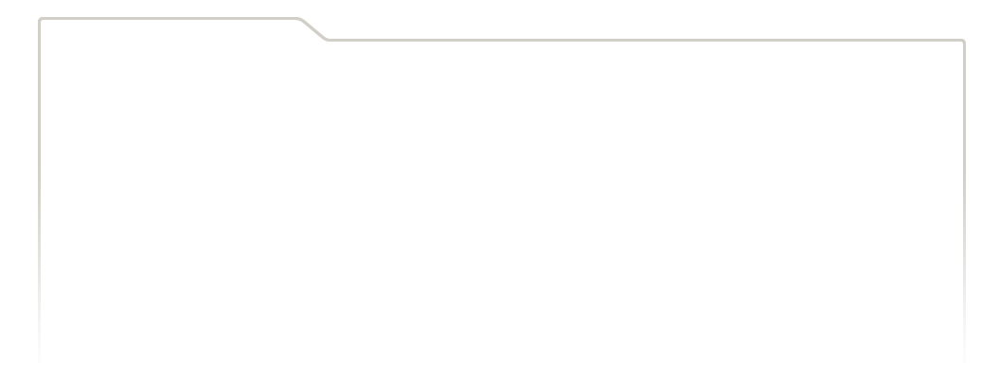
...
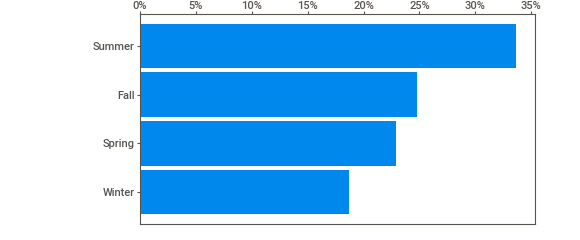
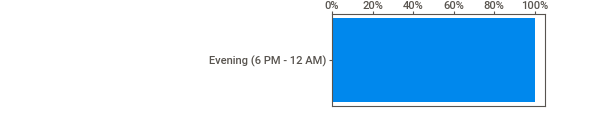
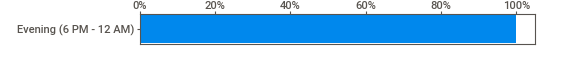
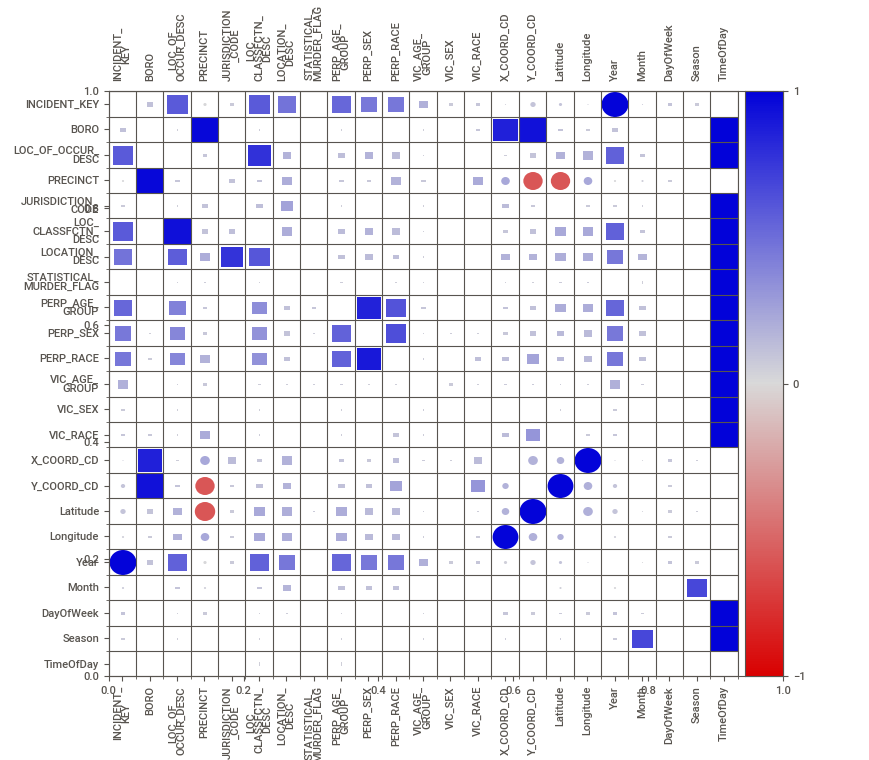
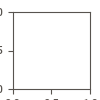

In [33]:
display(HTML("report.html"))

In [34]:

profile = nypd_data.profile_report(title='nypd_data')
profile.to_file("nypd_data.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/model/pandas/discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[9 9 3 ... 9 9 9]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
/usr/local/lib/python3.10/dist-packages/ydata_profiling/model/pandas/discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[3 5 3 ... 4 5 5]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:


display(HTML("nypd_data.html"))

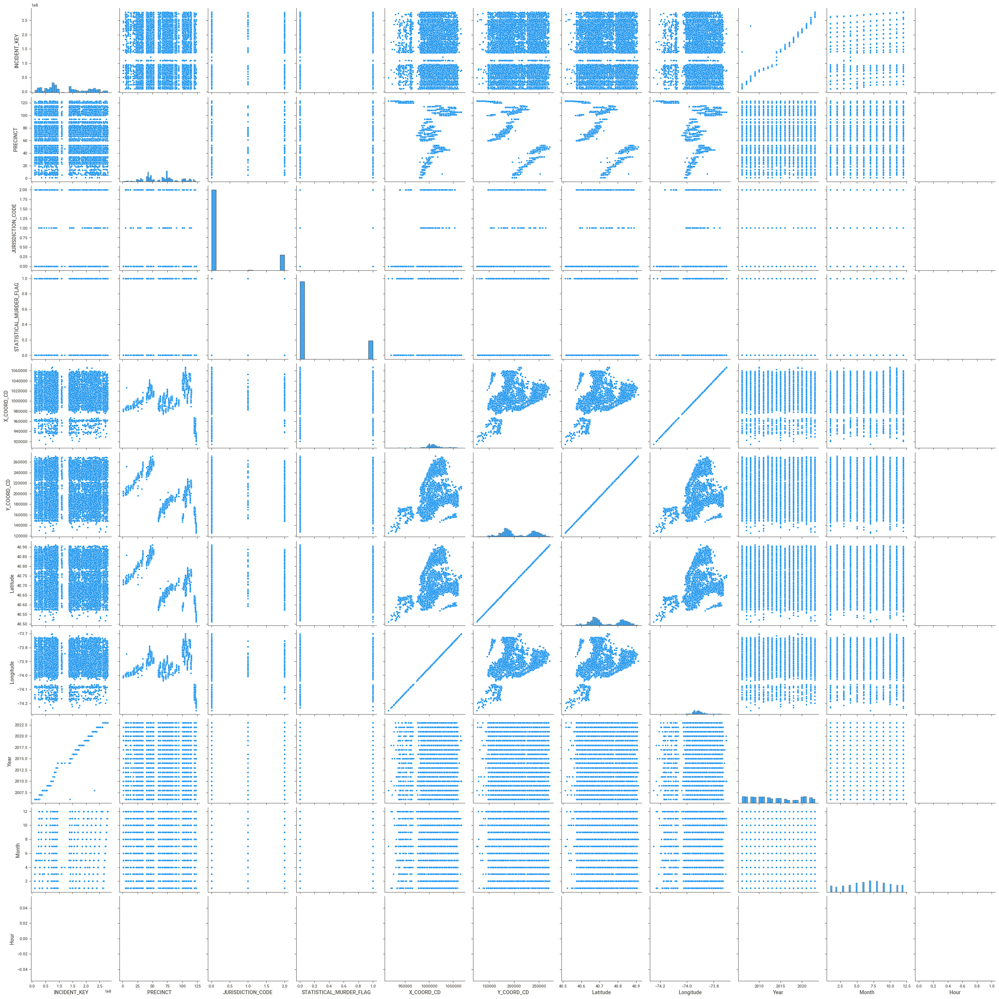

In [36]:
import seaborn as sns
sns.pairplot(nypd_data)

# **Data Cleaning**

In [37]:
  nypd_data.isnull().sum()

,0
INCIDENT_KEY,0
OCCUR_DATE,0
OCCUR_TIME,0
BORO,0
LOC_OF_OCCUR_DESC,25596
PRECINCT,0
JURISDICTION_CODE,2
LOC_CLASSFCTN_DESC,25596
LOCATION_DESC,14977
STATISTICAL_MURDER_FLAG,0


In [38]:
nypd_data.shape

(28562, 27)

In [39]:
#dropping columns which are missing more 25% of the values
nypd_data = nypd_data.drop(['Hour', 'LOC_OF_OCCUR_DESC','LOC_CLASSFCTN_DESC','LOCATION_DESC'], axis=1)

In [40]:
#dropping the rows which are missing values
nypd_data = nypd_data.dropna()

In [41]:
nypd_data.isnull().sum()

,0
INCIDENT_KEY,0
OCCUR_DATE,0
OCCUR_TIME,0
BORO,0
PRECINCT,0
JURISDICTION_CODE,0
STATISTICAL_MURDER_FLAG,0
PERP_AGE_GROUP,0
PERP_SEX,0
PERP_RACE,0


In [42]:
#Dropping the columns which are not important for our analysis
nypd_data = nypd_data.drop(['INCIDENT_KEY', 'X_COORD_CD','Y_COORD_CD','Lon_Lat', 'OCCUR_TIME'], axis=1)

In [43]:
#Below is the shape of our final cleaned dataset
nypd_data.shape

(19157, 18)

In [44]:
nypd_data.head()

,OCCUR_DATE,BORO,PRECINCT,JURISDICTION_CODE,STATISTICAL_MURDER_FLAG,PERP_AGE_GROUP,PERP_SEX,PERP_RACE,VIC_AGE_GROUP,VIC_SEX,VIC_RACE,Latitude,Longitude,Year,Month,DayOfWeek,Season,TimeOfDay
0,2022-05-05,MANHATTAN,14,0.0,True,25-44,M,BLACK,25-44,M,BLACK,40.754692,-73.993500,2022,5,Thursday,Spring,Evening (6 PM - 12 AM)
1,2022-07-04,BRONX,48,0.0,True,(null),(null),(null),18-24,M,BLACK,40.854402,-73.882330,2022,7,Monday,Summer,Evening (6 PM - 12 AM)
3,2019-09-24,BRONX,42,0.0,False,25-44,M,UNKNOWN,25-44,M,BLACK,40.832417,-73.890714,2019,9,Tuesday,Fall,Evening (6 PM - 12 AM)
4,2007-02-25,BROOKLYN,83,0.0,False,25-44,M,BLACK,25-44,M,BLACK,40.688443,-73.910219,2007,2,Sunday,Winter,Evening (6 PM - 12 AM)
9,2021-12-22,BRONX,49,0.0,True,25-44,M,WHITE HISPANIC,25-44,M,BLACK,40.860463,-73.865561,2021,12,Wednesday,Winter,Evening (6 PM - 12 AM)


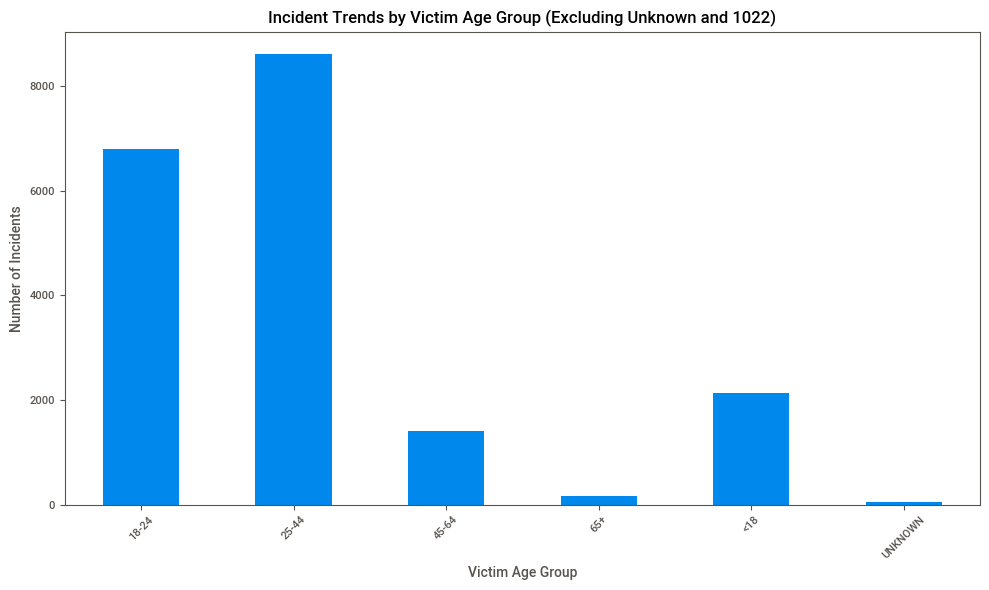

In [45]:
# prompt: create a graph showing age factor excluding the columns Unkown and 1022

# Filter out 'Unknown' and '1022' from VIC_AGE_GROUP
filtered_age_data = nypd_data[~nypd_data['VIC_AGE_GROUP'].isin(['Unknown', '1022'])]

# Aggregate incidents by victim age group
age_trends = filtered_age_data['VIC_AGE_GROUP'].value_counts().sort_index()

# Plot incident trends by victim age group
plt.figure(figsize=(10, 6))
age_trends.plot(kind='bar')
plt.title('Incident Trends by Victim Age Group (Excluding Unknown and 1022)')
plt.xlabel('Victim Age Group')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **Visualizing the data after cleaning**

### To help analysis the data better after cleaning

<ipython-input-46-f238fb9a8dd7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(nypd_data, x='PRECINCT', y='PERP_RACE', inner='box', palette='Dark2')


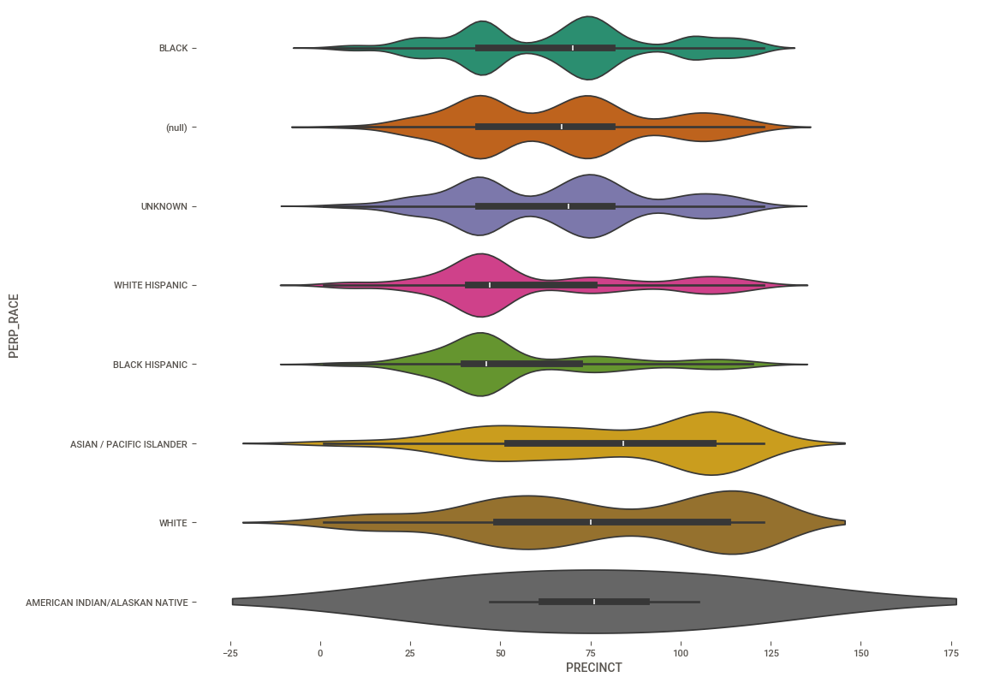

In [46]:
figsize = (12, 1.2 * len(nypd_data['PERP_RACE'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(nypd_data, x='PRECINCT', y='PERP_RACE', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

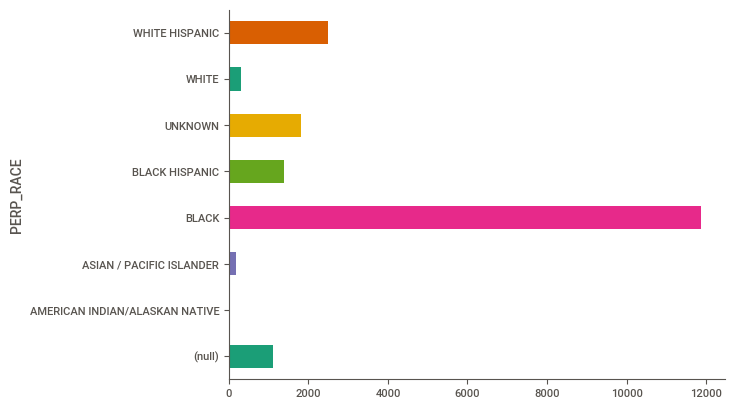

In [47]:
nypd_data.groupby('PERP_RACE').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

<ipython-input-48-955000470ccc>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(nypd_data, x='PRECINCT', y='BORO', inner='box', palette='Dark2')


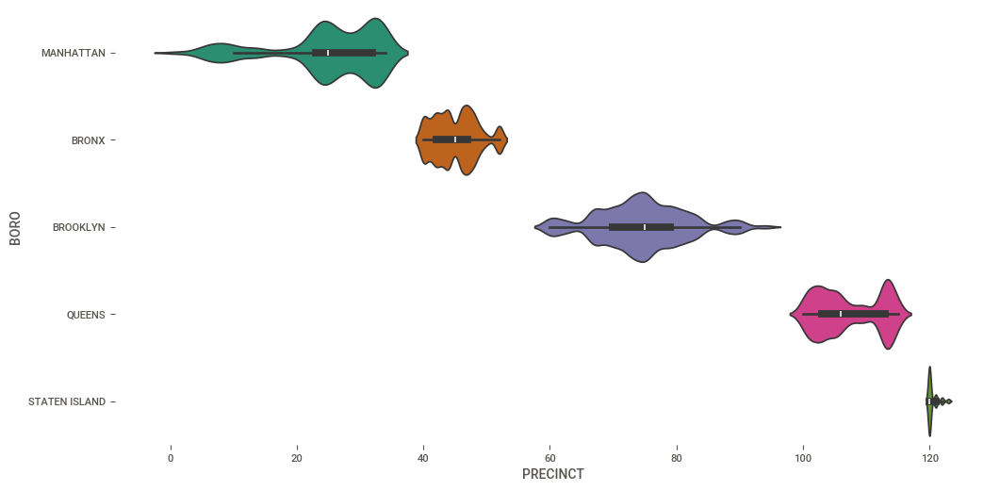

In [48]:
figsize = (12, 1.2 * len(nypd_data['BORO'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(nypd_data, x='PRECINCT', y='BORO', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

# **Feature Engineering**

In [49]:
# Same demographic flag
nypd_data['Same_Race'] = (nypd_data['PERP_RACE'] == nypd_data['VIC_RACE']).astype(int)
nypd_data['Same_Gender'] = (nypd_data['PERP_SEX'] == nypd_data['VIC_SEX']).astype(int)


In [50]:
from sklearn.cluster import KMeans

# Assuming 10 clusters for NYC areas; you can adjust this number
kmeans = KMeans(n_clusters=10, random_state=42)
nypd_data['LocationCluster'] = kmeans.fit_predict(nypd_data[['Latitude', 'Longitude']])

In [51]:
nypd_data.dtypes

,0
OCCUR_DATE,datetime64[ns]
BORO,object
PRECINCT,int64
JURISDICTION_CODE,float64
STATISTICAL_MURDER_FLAG,bool
PERP_AGE_GROUP,object
PERP_SEX,object
PERP_RACE,object
VIC_AGE_GROUP,object
VIC_SEX,object


In [52]:
nypd_data['BORO'].unique()

array(['MANHATTAN', 'BRONX', 'BROOKLYN', 'QUEENS', 'STATEN ISLAND'],
      dtype=object)

In [53]:
nypd_data['PERP_AGE_GROUP'].unique()

array(['25-44', '(null)', '18-24', '45-64', 'UNKNOWN', '<18', '65+',
       '1020', '940', '224'], dtype=object)

In [54]:
nypd_data = nypd_data[~nypd_data['PERP_AGE_GROUP'].isin(['(null)', 'UNKNOWN', '1020', '940', '224'])]

In [55]:
nypd_data['PERP_AGE_GROUP'].unique()

array(['25-44', '18-24', '45-64', '<18', '65+'], dtype=object)

In [56]:
nypd_data['PERP_SEX'].unique()

array(['M', 'F', 'U'], dtype=object)

In [57]:
nypd_data = nypd_data[~nypd_data['PERP_SEX'].isin(['U'])]

In [58]:
nypd_data['PERP_SEX'].unique()

array(['M', 'F'], dtype=object)

In [59]:
nypd_data['PERP_RACE'].unique()

array(['BLACK', 'UNKNOWN', 'WHITE HISPANIC', 'BLACK HISPANIC',
       'ASIAN / PACIFIC ISLANDER', 'WHITE',
       'AMERICAN INDIAN/ALASKAN NATIVE'], dtype=object)

In [60]:
nypd_data = nypd_data[~nypd_data['PERP_RACE'].isin(['UNKNOWN'])]

In [61]:
nypd_data['PERP_RACE'].unique()

array(['BLACK', 'WHITE HISPANIC', 'BLACK HISPANIC',
       'ASIAN / PACIFIC ISLANDER', 'WHITE',
       'AMERICAN INDIAN/ALASKAN NATIVE'], dtype=object)

In [62]:
nypd_data['VIC_AGE_GROUP'].unique()

array(['25-44', '65+', '<18', '45-64', '18-24', 'UNKNOWN', '1022'],
      dtype=object)

In [63]:
nypd_data = nypd_data[~nypd_data['VIC_AGE_GROUP'].isin(['1022','UNKNOWN'])]

In [64]:
nypd_data['VIC_AGE_GROUP'].unique()

array(['25-44', '65+', '<18', '45-64', '18-24'], dtype=object)

In [65]:
nypd_data['VIC_SEX'].unique()

array(['M', 'F', 'U'], dtype=object)

In [66]:
nypd_data = nypd_data[~nypd_data['VIC_SEX'].isin(['U'])]

In [67]:
nypd_data['VIC_SEX'].unique()

array(['M', 'F'], dtype=object)

In [68]:
nypd_data['VIC_RACE'].unique()

array(['BLACK', 'WHITE', 'WHITE HISPANIC', 'BLACK HISPANIC',
       'ASIAN / PACIFIC ISLANDER', 'UNKNOWN',
       'AMERICAN INDIAN/ALASKAN NATIVE'], dtype=object)

In [69]:
nypd_data = nypd_data[~nypd_data['VIC_RACE'].isin(['UNKNOWN'])]

In [70]:
nypd_data['VIC_RACE'].unique()

array(['BLACK', 'WHITE', 'WHITE HISPANIC', 'BLACK HISPANIC',
       'ASIAN / PACIFIC ISLANDER', 'AMERICAN INDIAN/ALASKAN NATIVE'],
      dtype=object)

In [71]:
nypd_data['DayOfWeek'].unique()

array(['Thursday', 'Sunday', 'Wednesday', 'Monday', 'Tuesday', 'Saturday',
       'Friday'], dtype=object)

In [72]:
nypd_data['Season'].unique()

array(['Spring', 'Winter', 'Fall', 'Summer'], dtype=object)

In [73]:
nypd_data['TimeOfDay'].unique()

array(['Evening (6 PM - 12 AM)'], dtype=object)

In [74]:
nypd_data['BORO_encoded'] = nypd_data['BORO'].map({'MANHATTAN': 0, 'BRONX': 1, 'BROOKLYN': 2, 'QUEENS': 3, 'STATEN ISLAND': 4}).astype(int)

nypd_data['PERP_AGE_GROUP_encoded'] = nypd_data['PERP_AGE_GROUP'].map({'25-44': 0, '18-24': 1, '45-64': 2, '<18': 3, '65+': 4}).astype(int)

nypd_data['PERP_SEX_encoded'] = nypd_data['PERP_SEX'].map({'M': 0, 'F': 1}).astype(int)

nypd_data['PERP_RACE_encoded'] = nypd_data['PERP_RACE'].map({'BLACK':0, 'WHITE HISPANIC':1, 'BLACK HISPANIC':2,'ASIAN / PACIFIC ISLANDER':3, 'WHITE':4,'AMERICAN INDIAN/ALASKAN NATIVE':5}).astype(int)

nypd_data['VIC_AGE_GROUP_encoded'] = nypd_data['VIC_AGE_GROUP'].map({'25-44': 0, '18-24': 1, '45-64': 2, '<18': 3, '65+': 4}).astype(int)

nypd_data['VIC_SEX_encoded'] = nypd_data['VIC_SEX'].map({'M': 0, 'F': 1}).astype(int)

nypd_data['VIC_RACE_encoded'] = nypd_data['VIC_RACE'].map({'BLACK':0, 'WHITE HISPANIC':1, 'BLACK HISPANIC':2,'ASIAN / PACIFIC ISLANDER':3, 'WHITE':4,'AMERICAN INDIAN/ALASKAN NATIVE':5}).astype(int)

nypd_data['DayOfWeek_encoded'] = nypd_data['DayOfWeek'].map({'Thursday':3, 'Tuesday':1, 'Sunday':6, 'Wednesday':2, 'Monday':0, 'Saturday':5,'Friday':4}).astype(int)

nypd_data['Season_encoded'] = nypd_data['Season'].map({'Spring':0, 'Fall':1, 'Winter':2, 'Summer':3}).astype(int)

nypd_data['TimeOfDay_encoded'] = nypd_data['TimeOfDay'].map({'Evening (6 PM - 12 AM)':0}).astype(int)

In [75]:
nypd_data['STATISTICAL_MURDER_FLAG'].unique()

array([ True, False])

In [76]:
# Convert the boolean column directly to integers
nypd_data['STATISTICAL_MURDER_FLAG_encoded'] = nypd_data['STATISTICAL_MURDER_FLAG'].astype(int)

In [77]:
nypd_data = nypd_data.drop(['BORO', 'PERP_AGE_GROUP','PERP_SEX','PERP_RACE', 'VIC_AGE_GROUP','VIC_SEX','VIC_RACE','DayOfWeek','Season','TimeOfDay', ], axis=1)

In [78]:
#Dropping Time of Day column because only time recorded after cleaning the date is Evening (6 PM - 12 AM)
nypd_data = nypd_data.drop(['TimeOfDay_encoded'], axis=1)

In [79]:
nypd_data = nypd_data.drop(['STATISTICAL_MURDER_FLAG'], axis=1)

In [80]:
nypd_data.dtypes

,0
OCCUR_DATE,datetime64[ns]
PRECINCT,int64
JURISDICTION_CODE,float64
Latitude,float64
Longitude,float64
Year,int32
Month,int32
Same_Race,int64
Same_Gender,int64
LocationCluster,int32


# **Descriptive and Predictive Modeling**

Correlation Analysis and Visualization:

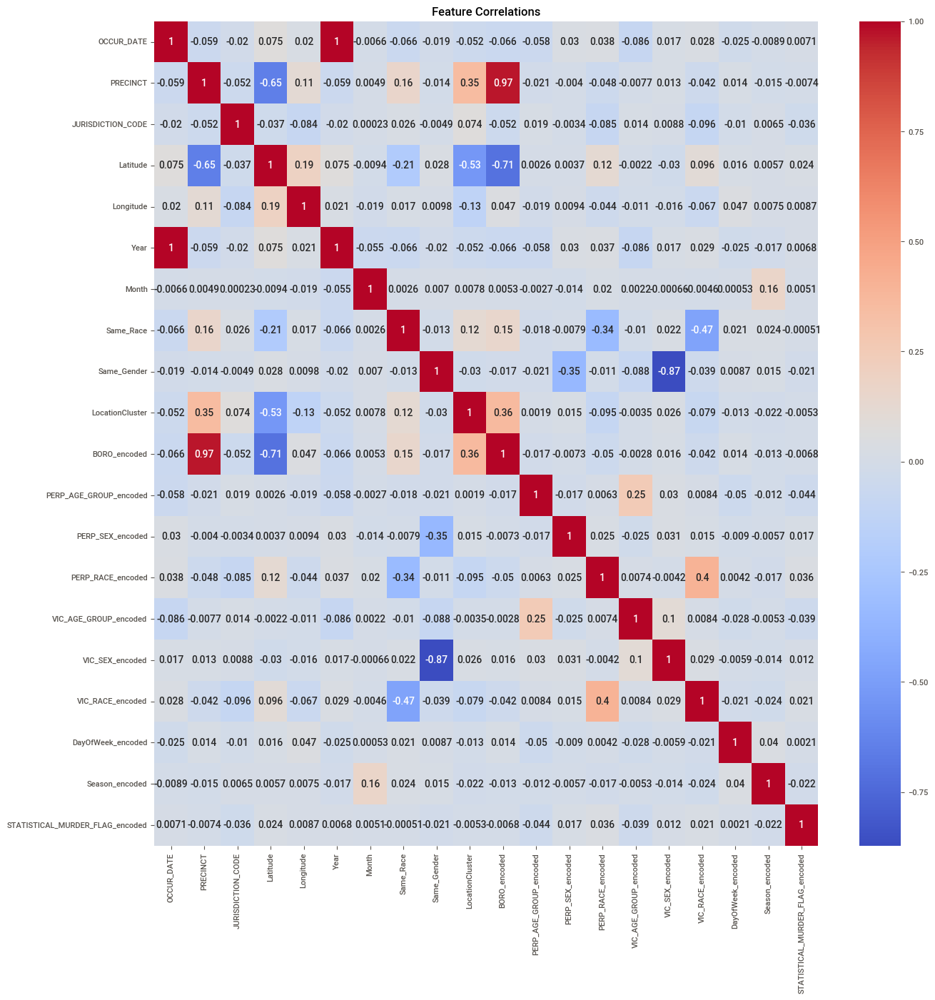

In [81]:
# Calculate correlations
corr_matrix = nypd_data.corr()

# Plot heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Feature Correlations')
plt.show()


In [82]:
# Save the cleaned dataset to a new CSV file
nypd_data.to_csv('cleaned_df.csv', index=False)

# **Date and Time Features**

In [83]:
# Convert OCCUR_DATE to datetime
nypd_data['OCCUR_DATE'] = pd.to_datetime(nypd_data['OCCUR_DATE'])

# Extract additional time-based features
nypd_data['DayOfWeek'] = nypd_data['OCCUR_DATE'].dt.dayofweek  # Day of the week
nypd_data['Weekend'] = nypd_data['DayOfWeek'].apply(lambda x: 1 if x >= 5 else 0)  # Weekend indicator

# Attempt to extract hour, if it exists
nypd_data['Hour'] = nypd_data['OCCUR_DATE'].dt.hour

# Display the results for verification
nypd_data[['OCCUR_DATE', 'DayOfWeek', 'Weekend', 'Hour']].head()


,OCCUR_DATE,DayOfWeek,Weekend,Hour
0,2022-05-05,3,0,0
4,2007-02-25,6,1,0
9,2021-12-22,2,0,0
13,2021-11-22,0,0,0
18,2021-02-16,1,0,0


# **Location-Based Clustering with Latitude and Longitude**

In [84]:
from sklearn.cluster import KMeans

# Define number of clusters
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
nypd_data['Location_Cluster'] = kmeans.fit_predict(nypd_data[['Latitude', 'Longitude']])

# Display the DataFrame with new Location_Cluster column
nypd_data[['Latitude', 'Longitude', 'Location_Cluster']].head()

,Latitude,Longitude,Location_Cluster
0,40.754692,-73.993500,1
4,40.688443,-73.910219,5
9,40.860463,-73.865561,4
13,40.804816,-73.951267,0
18,40.717935,-73.985673,1


# **Temporal Binning for Year**

In [85]:
nypd_data.describe()

,OCCUR_DATE,PRECINCT,JURISDICTION_CODE,Latitude,Longitude,Year,Month,Same_Race,Same_Gender,LocationCluster,...,VIC_AGE_GROUP_encoded,VIC_SEX_encoded,VIC_RACE_encoded,DayOfWeek_encoded,Season_encoded,STATISTICAL_MURDER_FLAG_encoded,DayOfWeek,Weekend,Hour,Location_Cluster
count,14648,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,...,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.000000,14648.0,14648.000000
mean,2014-07-05 00:54:51.316220416,64.599877,0.315128,40.743771,-73.912284,2014.000478,6.614623,0.680093,0.865442,3.841139,...,0.865920,0.115715,0.569702,3.281404,1.586428,0.239760,3.281404,0.369197,0.0,5.199891
min,2006-01-01 00:00:00,1.000000,0.000000,40.520186,-74.230149,2006.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,2009-07-04 18:00:00,43.000000,0.000000,40.670167,-73.944301,2009.000000,4.000000,0.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.0,2.000000
50%,2013-12-25 00:00:00,67.000000,0.000000,40.716521,-73.914592,2013.000000,7.000000,1.000000,1.000000,3.000000,...,1.000000,0.000000,0.000000,4.000000,2.000000,0.000000,4.000000,0.000000,0.0,5.000000
75%,2019-11-20 06:00:00,81.000000,0.000000,40.828678,-73.882796,2019.000000,9.000000,1.000000,1.000000,7.000000,...,1.000000,0.000000,1.000000,5.000000,3.000000,0.000000,5.000000,1.000000,0.0,8.000000
max,2023-12-29 00:00:00,123.000000,2.000000,40.910818,-73.715638,2023.000000,12.000000,1.000000,1.000000,9.000000,...,4.000000,1.000000,5.000000,6.000000,3.000000,1.000000,6.000000,1.000000,0.0,9.000000
std,NaN,28.668944,0.725778,0.089179,0.069646,5.494543,3.162661,0.466456,0.341262,3.236595,...,1.018457,0.319894,0.979856,2.071436,1.177802,0.426951,2.071436,0.482604,0.0,3.201466


In [86]:
# Bin years into categories (example: pre/post 2015)
nypd_data['Year_Binned'] = pd.cut(nypd_data['Year'], bins=[2000, 2015, 2020, 2023], labels=['Before 2015', '2015-2020', '2020-2023'])

# Display Year_Binned
nypd_data[['Year', 'Year_Binned']].head()


,Year,Year_Binned
0,2022,2020-2023
4,2007,Before 2015
9,2021,2020-2023
13,2021,2020-2023
18,2021,2020-2023


# **Seasonal Aggregation**

In [87]:
# Aggregate by season for seasonal patterns (season column is already encoded)
seasonal_data = nypd_data.groupby('Season_encoded').size()

# Display seasonal shooting counts
print(seasonal_data)


Season_encoded
0    3656
1    3473
2    2792
3    4727
dtype: int64


# **Interaction Features**

In [88]:
# Create interaction terms, e.g., Same_Race and Same_Gender
nypd_data['Same_Race_Gender'] = nypd_data['Same_Race'] * nypd_data['Same_Gender']
nypd_data['PERP_VIC_RACE'] = nypd_data['PERP_RACE_encoded'] * nypd_data['VIC_RACE_encoded']

# Display the new interaction features
nypd_data[['Same_Race', 'Same_Gender', 'Same_Race_Gender', 'PERP_VIC_RACE']].head()


,Same_Race,Same_Gender,Same_Race_Gender,PERP_VIC_RACE
0,1,1,1,0
4,1,1,1,0
9,0,1,0,0
13,1,1,1,0
18,0,0,0,0


# **Hotspot Indicator**

In [89]:
# Marking frequent locations as hotspots (if they appear in shootings > threshold)
location_counts = nypd_data.groupby(['Latitude', 'Longitude']).size().reset_index(name='count')
hotspot_threshold = 5  # Choose a threshold based on frequency
location_counts['Hotspot'] = location_counts['count'] >= hotspot_threshold

# Merge hotspot indicator back to main DataFrame
nypd_data = nypd_data.merge(location_counts[['Latitude', 'Longitude', 'Hotspot']], on=['Latitude', 'Longitude'], how='left')

# Display sample rows with Hotspot feature
nypd_data[['Latitude', 'Longitude', 'Hotspot']].head()


,Latitude,Longitude,Hotspot
0,40.754692,-73.993500,True
1,40.688443,-73.910219,False
2,40.860463,-73.865561,False
3,40.804816,-73.951267,False
4,40.717935,-73.985673,False


# **Data Transformation**

**Scaling Continuous Variables**

In [90]:
from sklearn.preprocessing import StandardScaler

# Scaling Latitude and Longitude for clustering and predictive modeling
scaler = StandardScaler()
nypd_data[['Latitude_scaled', 'Longitude_scaled']] = scaler.fit_transform(nypd_data[['Latitude', 'Longitude']])

# Display scaled coordinates
nypd_data[['Latitude', 'Longitude', 'Latitude_scaled', 'Longitude_scaled']].head()

,Latitude,Longitude,Latitude_scaled,Longitude_scaled
0,40.754692,-73.993500,0.122460,-1.166166
1,40.688443,-73.910219,-0.620435,0.029659
2,40.860463,-73.865561,1.308552,0.670889
3,40.804816,-73.951267,0.684541,-0.559743
4,40.717935,-73.985673,-0.289722,-1.053776


**Temporal Conversion and Encoding Adjustments**

In [91]:
# Ensure OCCUR_DATE is in datetime format (already converted)
nypd_data['OCCUR_DATE'] = pd.to_datetime(nypd_data['OCCUR_DATE'])

# If categorical encoding adjustment is needed:
nypd_data['PERP_AGE_GROUP_encoded'] = nypd_data['PERP_AGE_GROUP_encoded'].astype('category')


# **Modeling Techniques**

**Clustering for Exploratory Analysis**

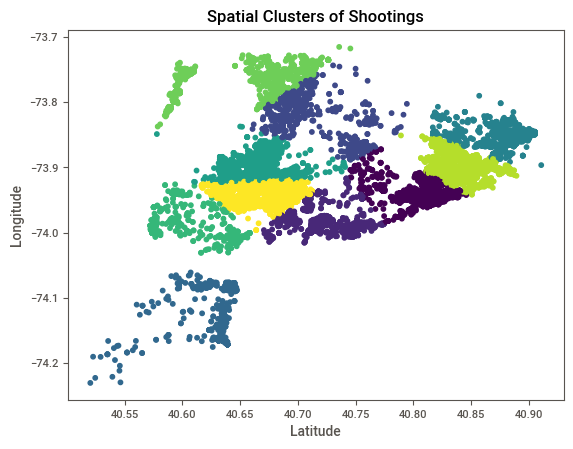

In [92]:
# K-means clustering was applied above in step 1.2, so we can visualize clusters.
import matplotlib.pyplot as plt

plt.scatter(nypd_data['Latitude'], nypd_data['Longitude'], c=nypd_data['Location_Cluster'], cmap='viridis', s=10)
plt.title('Spatial Clusters of Shootings')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.show()

**Time Series Analysis for Trends**

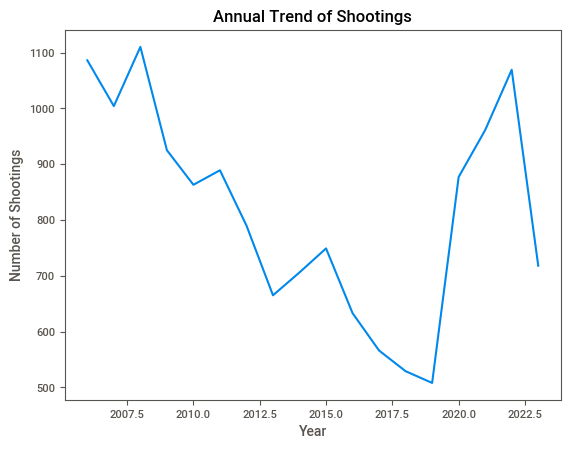

In [93]:
# Example of annual trend analysis
annual_trends = nypd_data.groupby('Year').size()
annual_trends.plot(kind='line', title='Annual Trend of Shootings')
plt.xlabel('Year')
plt.ylabel('Number of Shootings')
plt.show()


**Classification Model to Predict High-Risk Areas**

In [94]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Selecting relevant features for prediction
features = ['Latitude_scaled', 'Longitude_scaled', 'Month', 'DayOfWeek', 'Season_encoded']
target = 'Hotspot'  # Predicting if an area is a hotspot

X = nypd_data[features]
y = nypd_data[target]

# Split data for training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predictions and evaluation
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

       False       0.90      0.96      0.93      3224
        True       0.87      0.72      0.79      1171

    accuracy                           0.90      4395
   macro avg       0.89      0.84      0.86      4395
weighted avg       0.90      0.90      0.89      4395



**Temporal and Spatial Heatmaps**

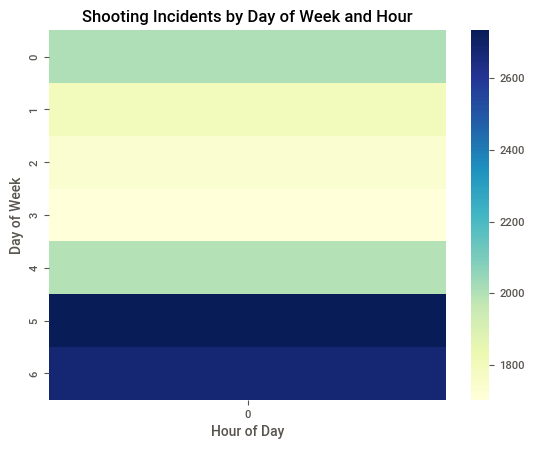

In [95]:
import seaborn as sns

# Heatmap for time-based hotspots (DayOfWeek vs. Hour)
time_heatmap_data = nypd_data.groupby(['DayOfWeek', 'Hour']).size().unstack(fill_value=0)
sns.heatmap(time_heatmap_data, cmap="YlGnBu")
plt.title("Shooting Incidents by Day of Week and Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.show()

# **Tuning model parameters**

In [96]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_dist = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4, 6],
    'max_features': ['sqrt', 'log2', None]
}

rf = RandomForestClassifier(random_state=42)

In [97]:
from sklearn.model_selection import RandomizedSearchCV

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=50,
    cv=5,
    scoring='accuracy',
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# Fit the RandomizedSearchCV
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30, 40, 50],
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 2, 4, 6],
                                        'min_samples_split': [2, 5, 10, 15],
                                        'n_estimators': [50, 100, 200, 300]},
                   random_state=42, scoring='accuracy', verbose=2)

In [98]:
# best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 40}
Best Score: 0.9476246922976298


**Randomized Search with Cross-Validation**

In [99]:
import numpy as np

# Define the parameter grid with a distribution for Random Search
param_dist = {
    'n_estimators': np.arange(50, 300, 50),
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4, 6],
    'max_features': ['sqrt', 'log2', None]
}

# Initialize the model
rf = RandomForestClassifier(random_state=42)

In [100]:
rf = RandomForestClassifier(random_state=42)
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=50, cv=5, scoring='accuracy', random_state=42, n_jobs=-1, verbose=2)
random_search.fit(X_train, y_train)

# Output best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': None}
Best Score: 0.9474298081839911


# **Evaluation and Interpretation**

In [101]:
# Best model from Grid or Randomized Search
best_model = random_search.best_estimator_  # Use `random_search.best_estimator_` if Randomized Search

# Evaluate the tuned model on the test set
y_pred = best_model.predict(X_test)

In [102]:
from sklearn.metrics import accuracy_score, classification_report
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Test Accuracy: 0.9558589306029579
Classification Report:
               precision    recall  f1-score   support

       False       0.97      0.97      0.97      3224
        True       0.91      0.92      0.92      1171

    accuracy                           0.96      4395
   macro avg       0.94      0.95      0.94      4395
weighted avg       0.96      0.96      0.96      4395

